In [22]:
#Install the preliminary packages to run the code
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Main framework

In [106]:
# Importing the datasets from Excel file
FX_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="G10_FX_TS", skiprows=1)
Bond2Y_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="2Y_bond_TS", skiprows=1)
Bond10Y_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="10Y_bond_TS", skiprows=1)
MM_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="MM_rates_TS", skiprows=1)
Stock_commo_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="Stock_commo_TS", skiprows=1)
CDS_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="CDS_TS", skiprows=1)

In [108]:
# Rename the first column to 'Date' in the dataframes
FX_data.rename(columns={FX_data.columns[0]: 'Date'}, inplace=True)
Bond2Y_data.rename(columns={Bond2Y_data.columns[0]: 'Date'}, inplace=True)
Bond10Y_data.rename(columns={Bond10Y_data.columns[0]: 'Date'}, inplace=True)
MM_data.rename(columns={MM_data.columns[0]: 'Date'}, inplace=True)
Stock_commo_data.rename(columns={Stock_commo_data.columns[0]: 'Date'}, inplace=True)
CDS_data.rename(columns={CDS_data.columns[0]: 'Date'}, inplace=True)

# Set 'Date' as the index for each dataframe
FX_data.set_index('Date', inplace=True)
Bond2Y_data.set_index('Date', inplace=True)
Bond10Y_data.set_index('Date', inplace=True)
MM_data.set_index('Date', inplace=True)
Stock_commo_data.set_index('Date', inplace=True)
CDS_data.set_index('Date', inplace=True)

In [109]:
# Drop rows with any NA values
FX_data.dropna(inplace=True)
Bond2Y_data.dropna(inplace=True)
Bond10Y_data.dropna(inplace=True)
MM_data.dropna(inplace=True)
Stock_commo_data.dropna(inplace=True)
CDS_data.dropna(inplace=True)

In [ ]:
'''
# Compute arithmetic returns
arith_returns = merged_df.pct_change().dropna()

# Look at the first few rows of returns
print(arith_returns.head())
print(arith_returns.describe())
'''

'\n# Compute arithmetic returns\narith_returns = merged_df.pct_change().dropna()\n\n# Look at the first few rows of returns\nprint(arith_returns.head())\nprint(arith_returns.describe())\n'

In [ ]:
'''
arith_returns.replace([np.inf, -np.inf], np.nan, inplace=True)
arith_returns.fillna(method='ffill', inplace=True)  # Forward fill again if new NaNs are introduced
arith_returns.dropna(inplace=True)
cap_threshold = 0.05  # 5% cap

print(arith_returns.describe())
'''

"\narith_returns.replace([np.inf, -np.inf], np.nan, inplace=True)\narith_returns.fillna(method='ffill', inplace=True)  # Forward fill again if new NaNs are introduced\narith_returns.dropna(inplace=True)\ncap_threshold = 0.05  # 5% cap\n\nprint(arith_returns.describe())\n"

In [ ]:
'''
annualized_mean_returns = ((1 + arith_returns).prod()) ** (252 / len(arith_returns)) - 1

# To annualize standard deviation (volatility), we multiply by the square root of the number of trading days (we took 252, but the results can be recomputed to 360 days convention)
annualized_std_dev = arith_returns.std() * np.sqrt(252)

annualized_results = pd.DataFrame({
    'Annualized mean return': annualized_mean_returns,
    'Annualized volatility': annualized_std_dev
})

annualized_results
'''

"\nannualized_mean_returns = ((1 + arith_returns).prod()) ** (252 / len(arith_returns)) - 1\n\n# To annualize standard deviation (volatility), we multiply by the square root of the number of trading days (we took 252, but the results can be recomputed to 360 days convention)\nannualized_std_dev = arith_returns.std() * np.sqrt(252)\n\nannualized_results = pd.DataFrame({\n    'Annualized mean return': annualized_mean_returns,\n    'Annualized volatility': annualized_std_dev\n})\n\nannualized_results\n"

In [111]:
# Function to normalize data to a base level (e.g., 100)
def normalize_to_base(data, base_level=100):
    return data / data.iloc[0] * base_level

# Function to clip extreme values
def clip_extreme_values(data, lower_quantile=0.01, upper_quantile=0.99):
    lower_bound = data.quantile(lower_quantile)
    upper_bound = data.quantile(upper_quantile)
    return data.clip(lower_bound, upper_bound, axis=1)

# Function to plot multiple assets with enhancements
def plot_assets_with_enhancements(data, title="Time series of rates levels", base_level=100, lower_quantile=0.01, upper_quantile=0.99):
    # Normalize the data to the base level
    data_normalized = normalize_to_base(data, base_level)

    # Clip extreme values
    data_clipped = clip_extreme_values(data_normalized, lower_quantile, upper_quantile)

    plt.figure(figsize=(14, 7))

    # Create a color palette
    palette = sns.color_palette("viridis", len(data_clipped.columns))

    # Plot each series with a different color
    ax = data_clipped.plot(figsize=(14, 7), color=palette, linewidth=2)

    # Add labels and title
    ax.set_xlabel("Date", fontsize=14)
    ax.set_ylabel(f"Reindexed to {base_level}", fontsize=14)
    ax.set_title(title, fontsize=16)

    # Improve legend
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=12)

    # Add grid and make it look professional
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Tight layout for better spacing
    plt.tight_layout()
    plt.show()

<Figure size 1400x700 with 0 Axes>

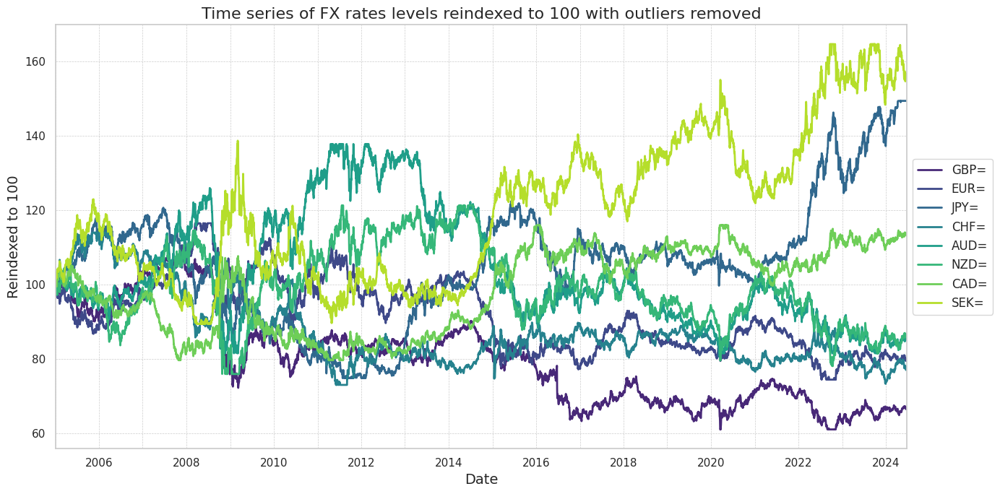

<Figure size 1400x700 with 0 Axes>

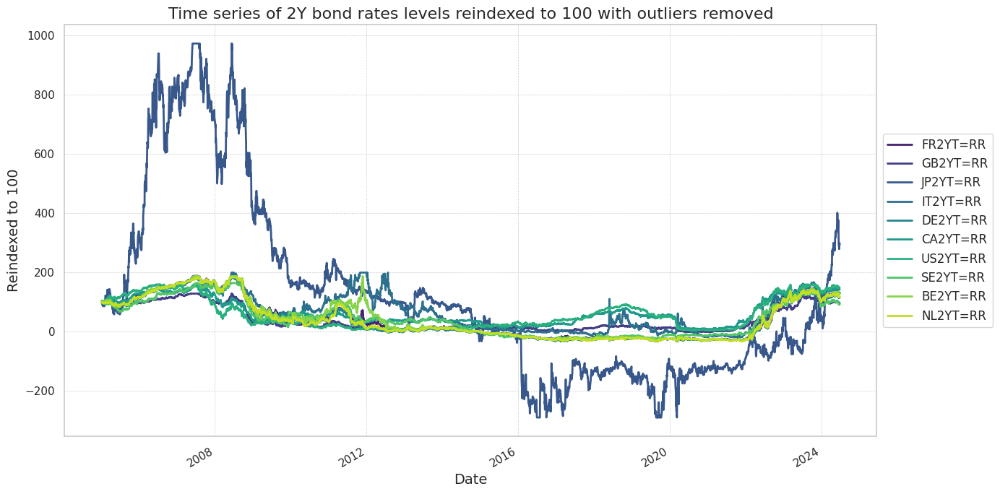

<Figure size 1400x700 with 0 Axes>

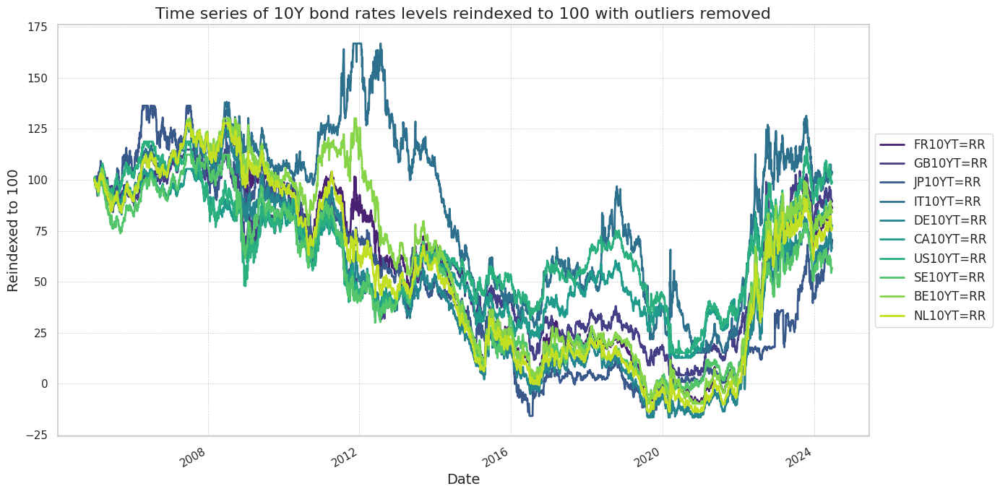

<Figure size 1400x700 with 0 Axes>

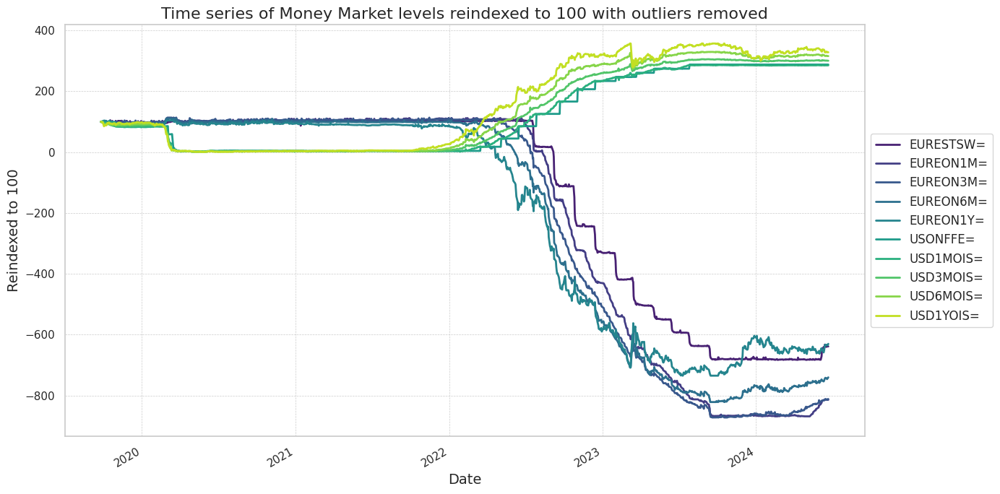

<Figure size 1400x700 with 0 Axes>

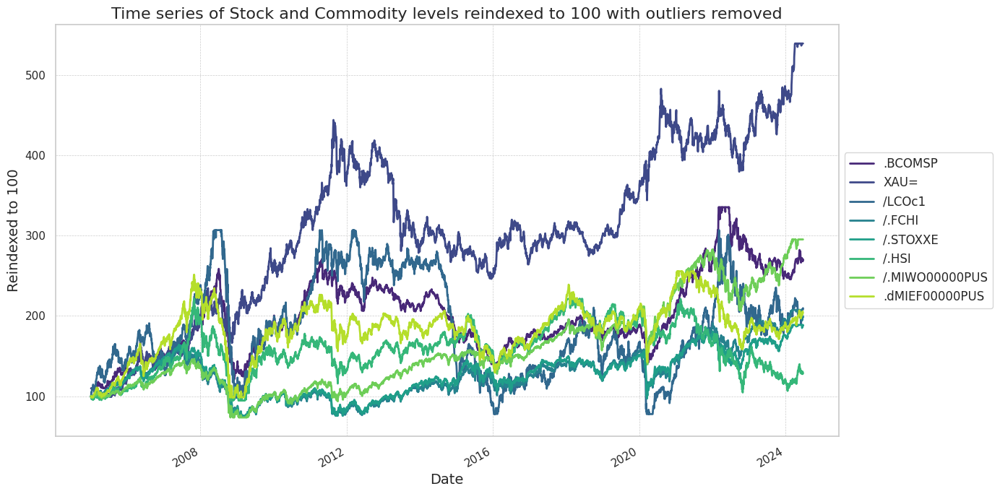

<Figure size 1400x700 with 0 Axes>

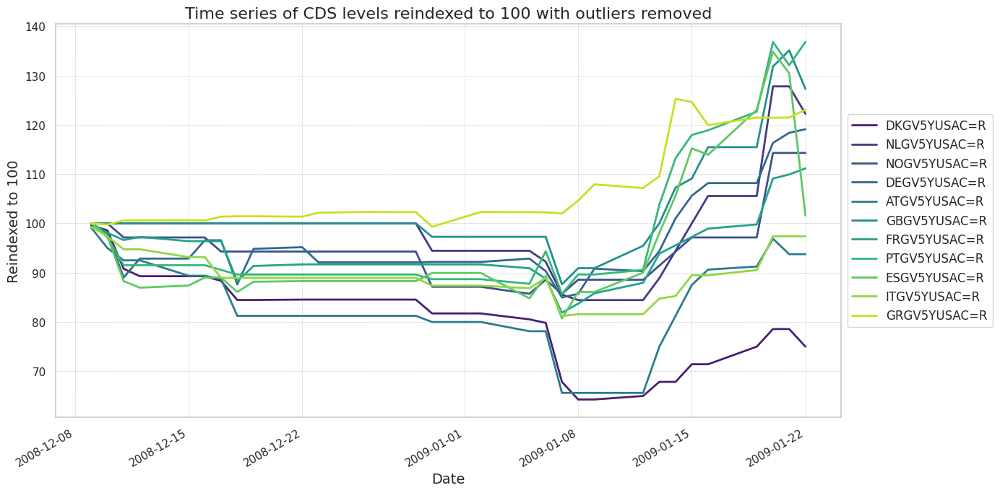

In [112]:
# Plot the data with enhancements and outlier removal
plot_assets_with_enhancements(FX_data, title="Time series of FX rates levels reindexed to 100 with outliers removed", base_level=100)
plot_assets_with_enhancements(Bond2Y_data, title="Time series of 2Y bond rates levels reindexed to 100 with outliers removed", base_level=100)
plot_assets_with_enhancements(Bond10Y_data, title="Time series of 10Y bond rates levels reindexed to 100 with outliers removed", base_level=100)
plot_assets_with_enhancements(MM_data, title="Time series of Money Market levels reindexed to 100 with outliers removed", base_level=100)
plot_assets_with_enhancements(Stock_commo_data, title="Time series of Stock and Commodity levels reindexed to 100 with outliers removed", base_level=100)
plot_assets_with_enhancements(CDS_data, title="Time series of CDS levels reindexed to 100 with outliers removed", base_level=100)

In [61]:
'''
# Function to plot time series with historical range
def plot_time_series_with_range(df, column, window_size):
    data = df[column].dropna()  # Drop NA values for the specific column
    rolling_min = data.rolling(window=window_size).min()
    rolling_max = data.rolling(window=window_size).max()

    plt.figure(figsize=(14, 7))
    plt.plot(data.index, data, label=f'{column} Level', color='blue')
    plt.fill_between(data.index, rolling_min, rolling_max, color='gray', alpha=0.3, label='Historical Range')

    plt.title(f'{column} with historical range ({window_size} days window)')
    plt.xlabel('Date')
    plt.ylabel('Level')
    plt.legend()
    plt.grid(True)
    plt.show()

# Set the window size for the rolling calculation
window_size = 7  # number of days
'''

In [96]:
'''
# Plot analysis with historical range for FX data
for column in FX_data.columns:
    plot_time_series_with_range(FX_data, column, window_size)

# Plot analysis with historical range for rates data (2Y yields)
for column in Bond2Y_data.columns:
    plot_time_series_with_range(Bond2Y_data, column, window_size)

# Plot analysis with historical range for rates data (10y yields)
for column in Bond10Y_data.columns:
    plot_time_series_with_range(Bond10Y_data, column, window_size)

# Plot analysis with historical range for money market rates data
for column in MM_data.columns:
    plot_time_series_with_range(MM_data, column, window_size)

# Plot analysis with historical range for Rates data
for column in Stock_commo_data.columns:
    plot_time_series_with_range(Stock_commo_data, column, window_size)

# Plot analysis with historical range for CDS data
for column in CDS_data.columns:
    plot_time_series_with_range(CDS_data, column, window_size)
'''

'\n# Plot analysis with historical range for FX data\nfor column in FX_data.columns:\n    plot_time_series_with_range(FX_data, column, window_size)\n\n# Plot analysis with historical range for rates data (2Y yields)\nfor column in Bond2Y_data.columns:\n    plot_time_series_with_range(Bond2Y_data, column, window_size)\n\n# Plot analysis with historical range for rates data (10y yields)\nfor column in Bond10Y_data.columns:\n    plot_time_series_with_range(Bond10Y_data, column, window_size)\n\n# Plot analysis with historical range for money market rates data\nfor column in MM_data.columns:\n    plot_time_series_with_range(MM_data, column, window_size)\n\n# Plot analysis with historical range for Rates data\nfor column in Stock_commo_data.columns:\n    plot_time_series_with_range(Stock_commo_data, column, window_size)\n\n# Plot analysis with historical range for CDS data\nfor column in CDS_data.columns:\n    plot_time_series_with_range(CDS_data, column, window_size)\n'

In [113]:
# Function to plot time series with historical range, mean, and percentiles
def plot_time_series_with_enhancements(df, column, window_size):
    data = df[column].dropna()  # Drop NA values for the specific column
    rolling_min = data.rolling(window=window_size).min()
    rolling_max = data.rolling(window=window_size).max()
    mean_level = data.mean()
    percentile_25 = data.rolling(window=window_size).quantile(0.25)
    percentile_75 = data.rolling(window=window_size).quantile(0.75)

    plt.figure(figsize=(14, 7))
    plt.plot(data.index, data, label=f'{column} Level', color='blue')
    plt.fill_between(data.index, rolling_min, rolling_max, color='gray', alpha=0.3, label='Historical Range')
    plt.axhline(y=mean_level, color='red', linestyle='-', linewidth=2, label='Mean Level')
    plt.plot(data.index, percentile_25, color='green', linestyle='--', linewidth=1.5, label='25th Percentile')
    plt.plot(data.index, percentile_75, color='purple', linestyle='--', linewidth=1.5, label='75th Percentile')

    plt.title(f'{column} with Historical range, mean, and percentiles ({window_size} days window)')
    plt.xlabel('Date')
    plt.ylabel('Level')
    plt.legend()
    plt.grid(True)
    plt.show()

# Set the window size for the rolling calculation
window_size = 180  # number of days

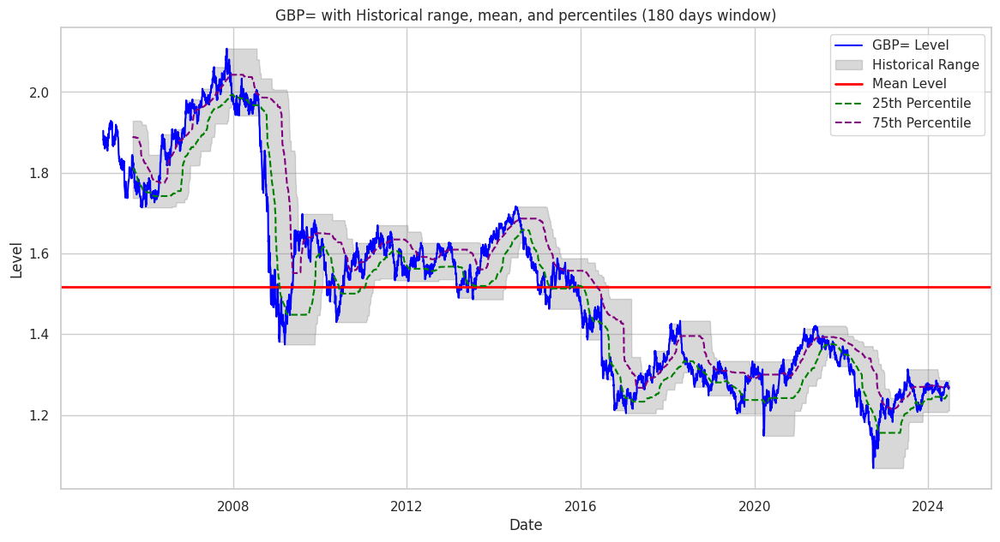

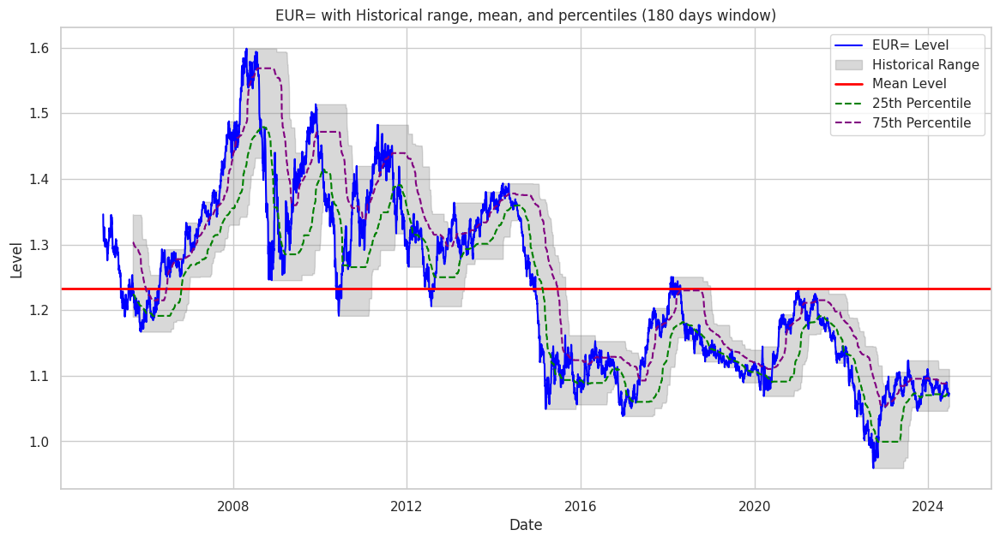

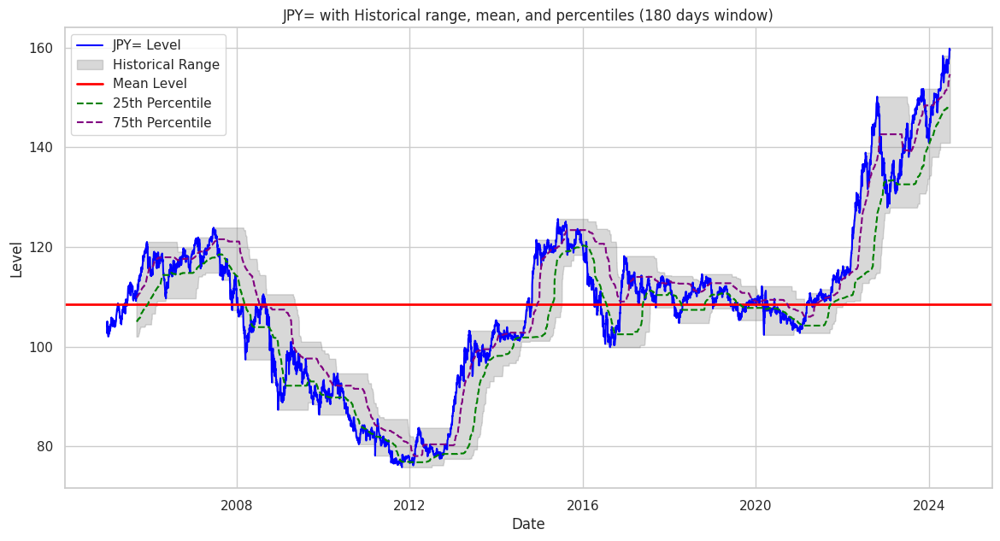

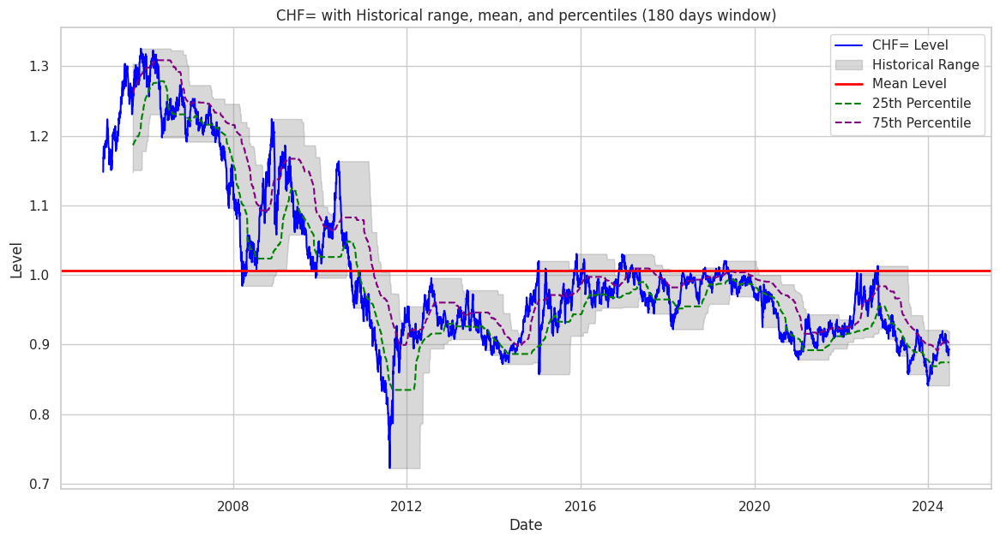

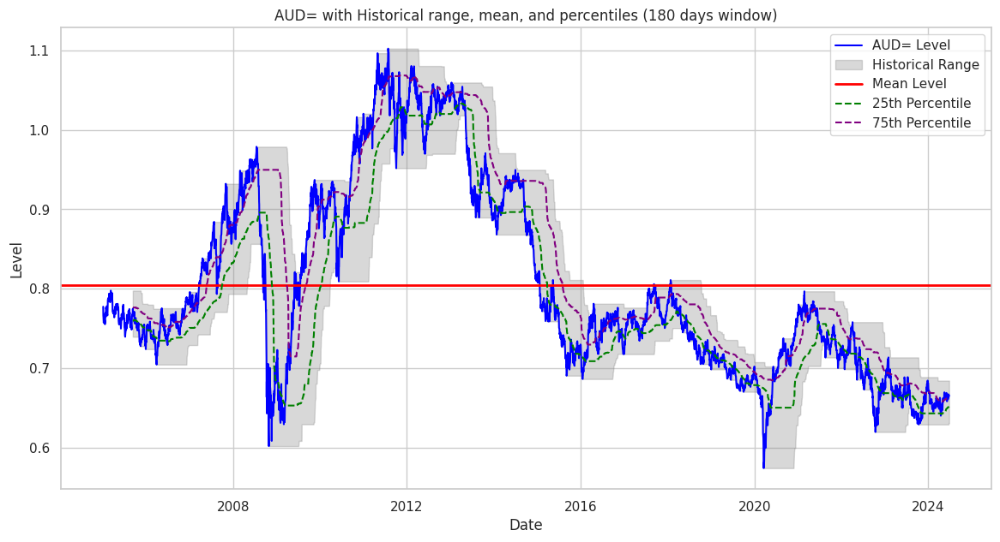

...

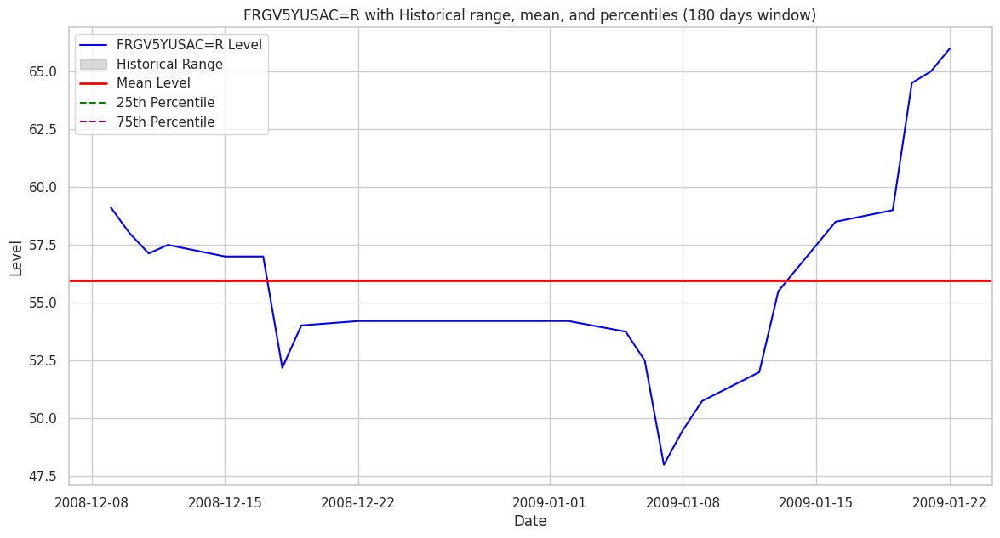

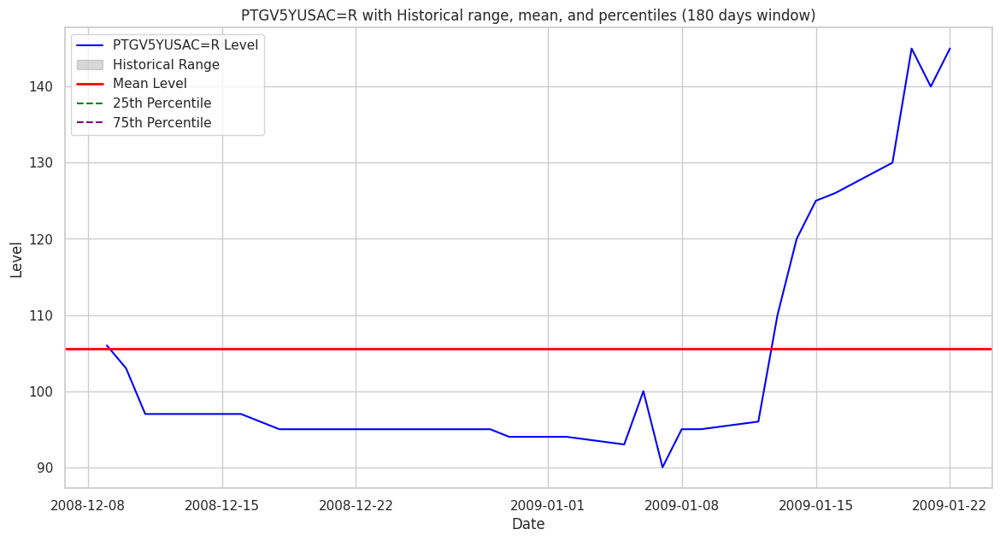

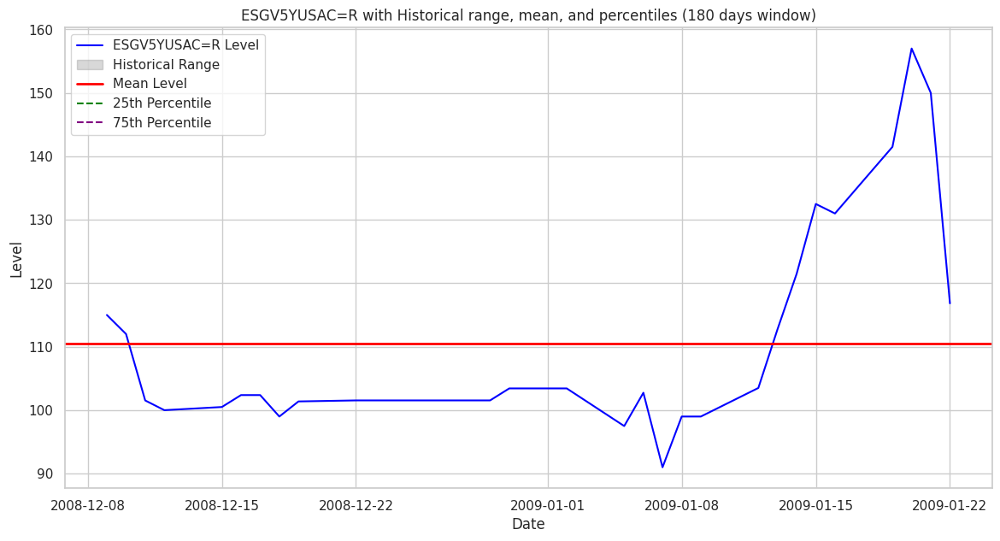

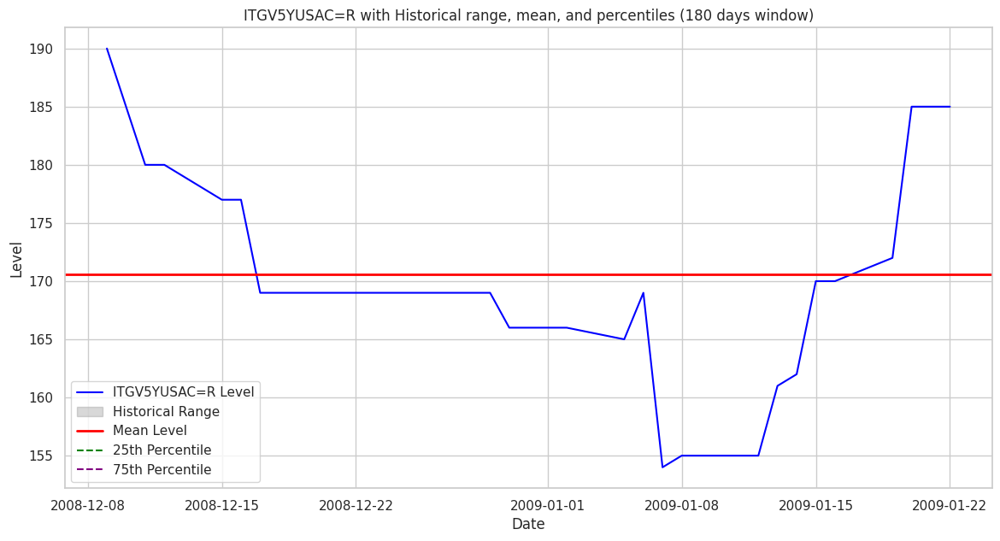

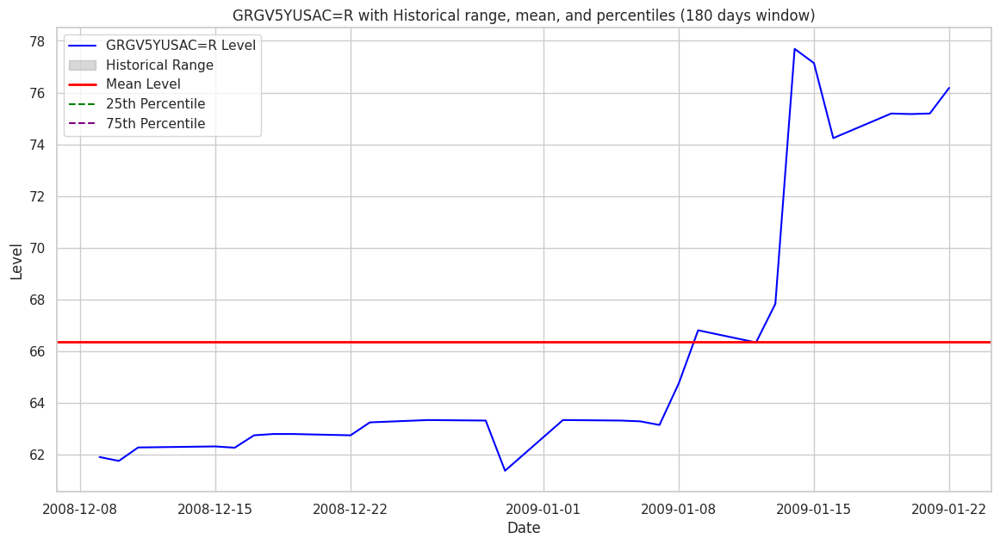

In [114]:
# Plot analysis with historical range for FX data
for column in FX_data.columns:
    plot_time_series_with_enhancements(FX_data, column,window_size)

# Plot analysis with historical range for rates data (2Y yields)
for column in Bond2Y_data.columns:
    plot_time_series_with_enhancements(Bond2Y_data, column, window_size)

# Plot analysis with historical range for rates data (10y yields)
for column in Bond10Y_data.columns:
    plot_time_series_with_enhancements(Bond10Y_data, column, window_size)

# Plot analysis with historical range for money market rates data
for column in MM_data.columns:
    plot_time_series_with_enhancements(MM_data, column, window_size)

# Plot analysis with historical range for Rates data
for column in Stock_commo_data.columns:
    plot_time_series_with_enhancements(Stock_commo_data, column, window_size)

# Plot analysis with historical range for CDS data
for column in CDS_data.columns:
    plot_time_series_with_enhancements(CDS_data, column, window_size)

In [115]:
# Function to plot distribution with enhancements
def plot_distribution_with_enhancements(df, column):
    data = df[column].dropna()  # Drop NA values for the specific column
    mean = data.mean()
    median = data.median()
    std_dev = data.std()

    plt.figure(figsize=(14, 7))

    # Histogram
    sns.histplot(data, bins=50, kde=True, color='blue', alpha=0.6)

    # Mean and median lines
    plt.axvline(mean, color='red', linestyle='-', linewidth=2, label=f'Mean: {mean:.2f}')
    plt.axvline(median, color='green', linestyle='--', linewidth=2, label=f'Median: {median:.2f}')

    # Annotations
    plt.title(f'Distribution of {column} level', fontsize=16)
    plt.xlabel('Returns', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.show()

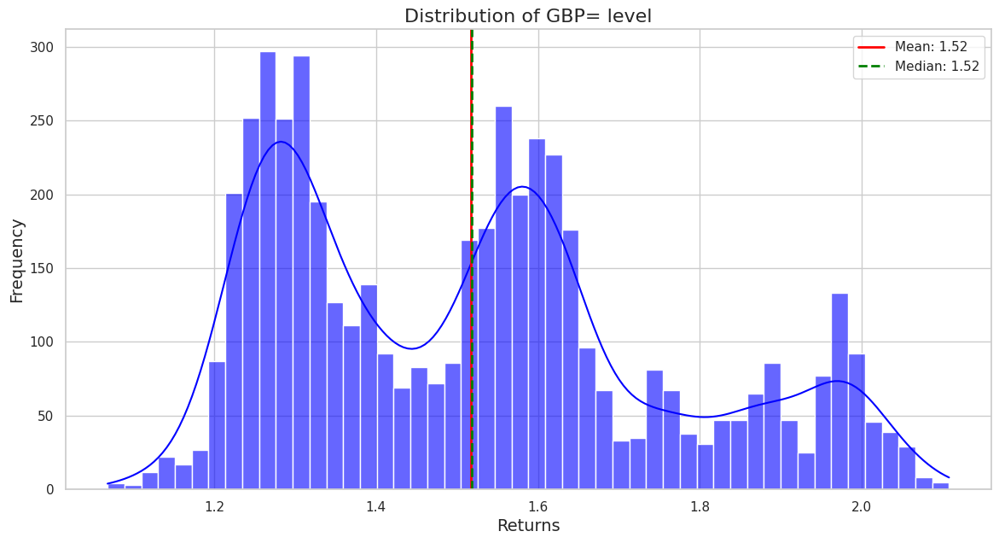

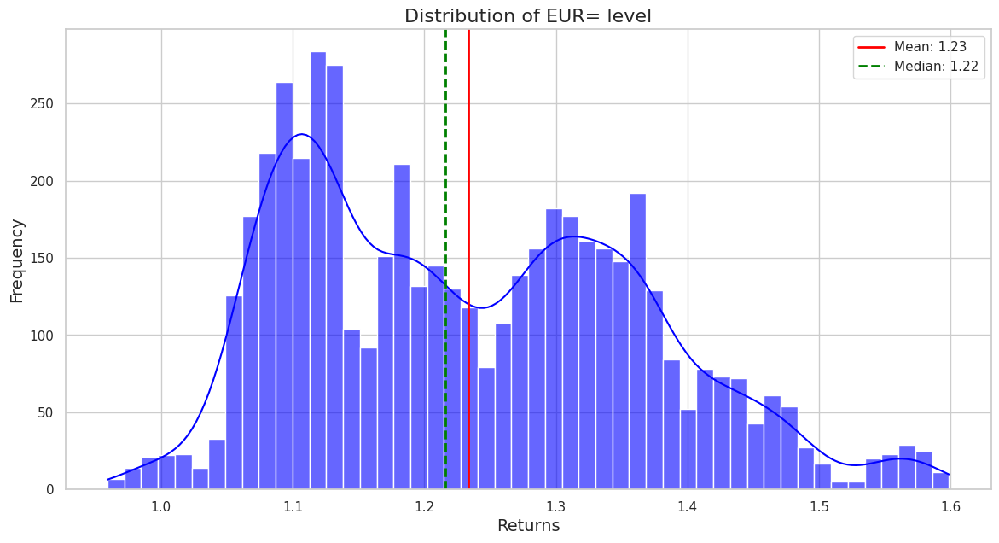

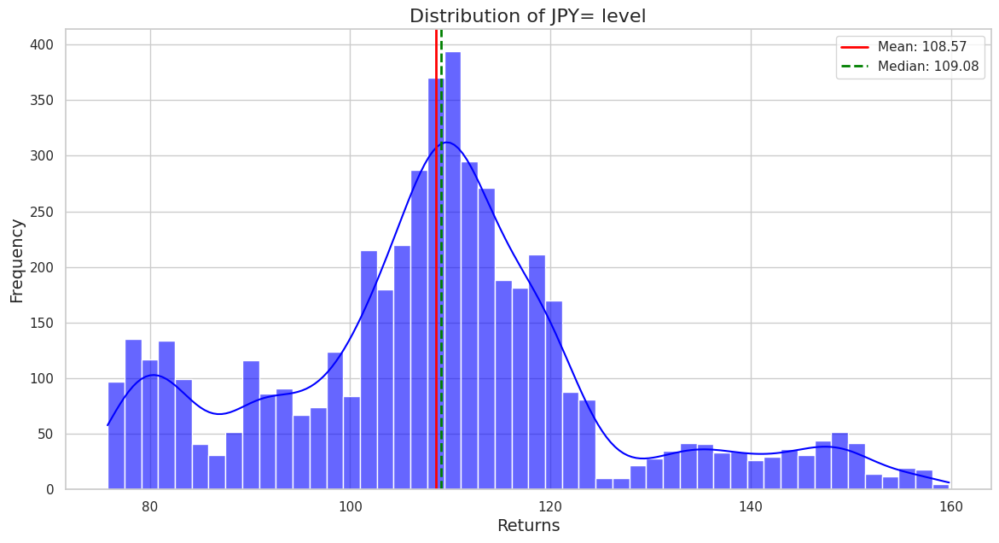

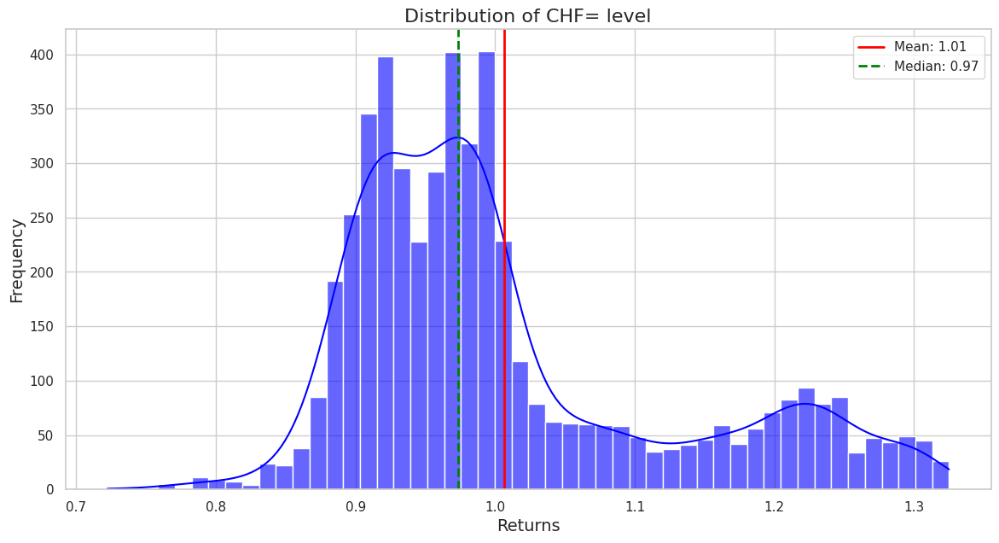

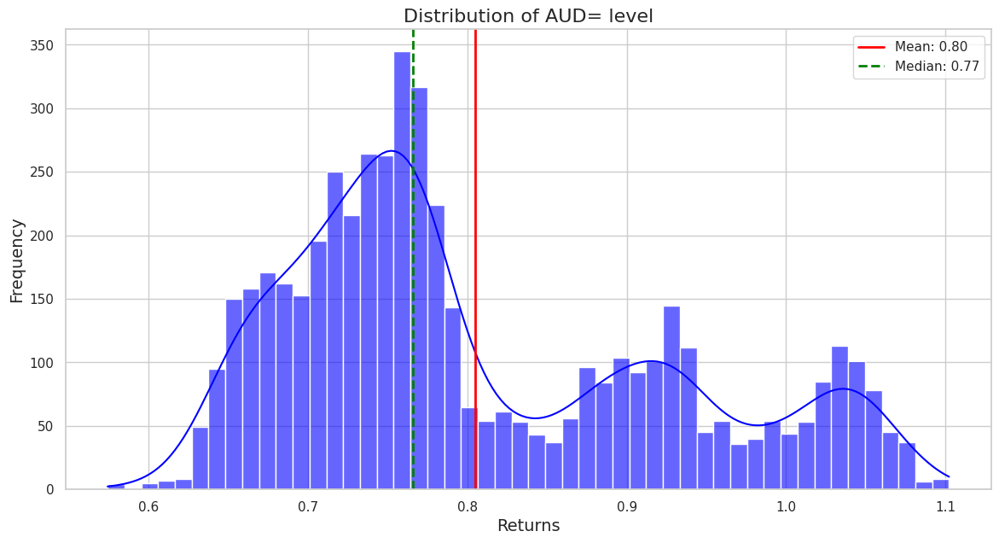

...

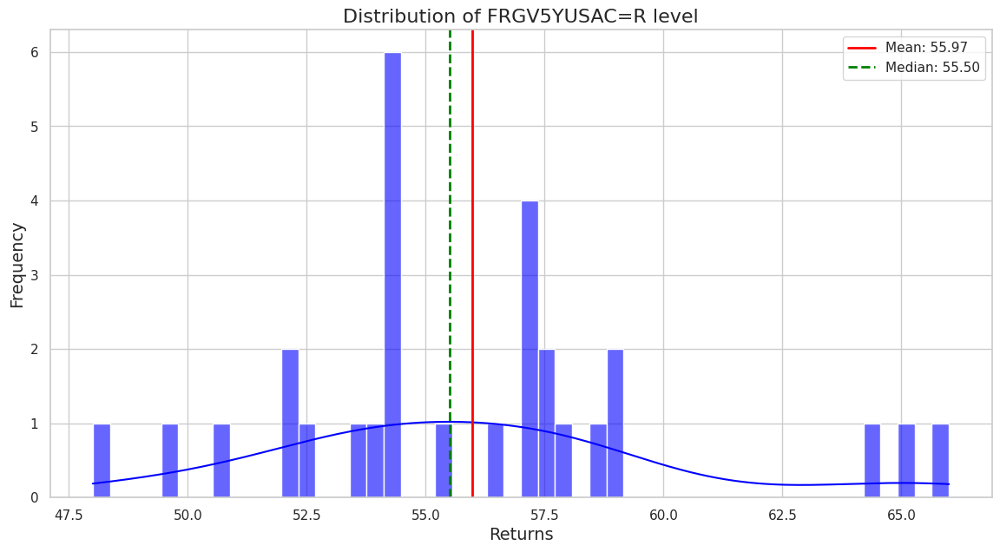

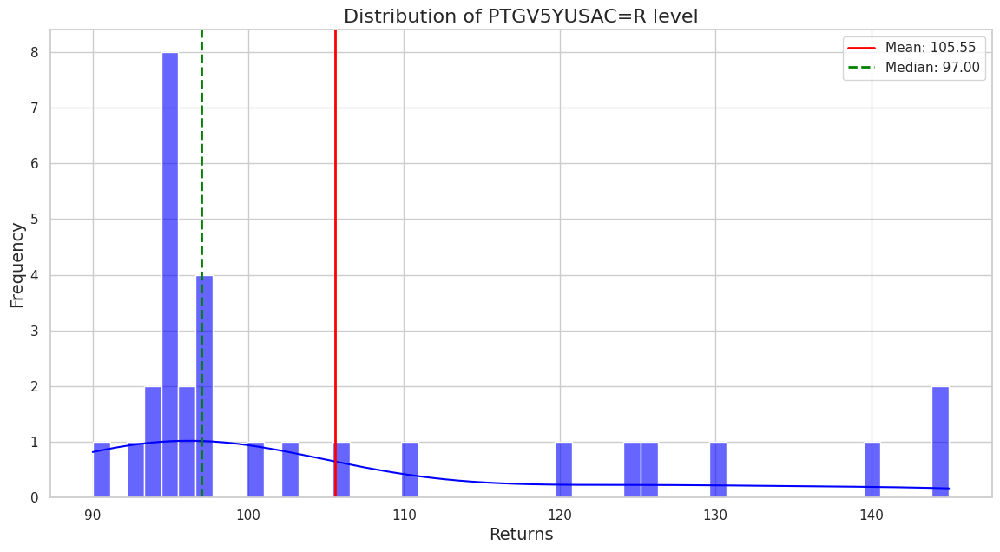

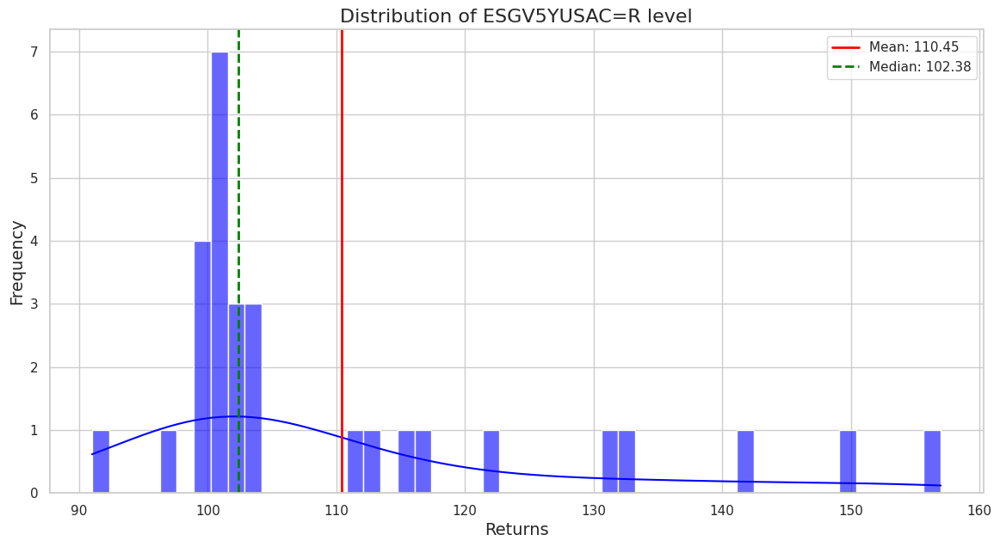

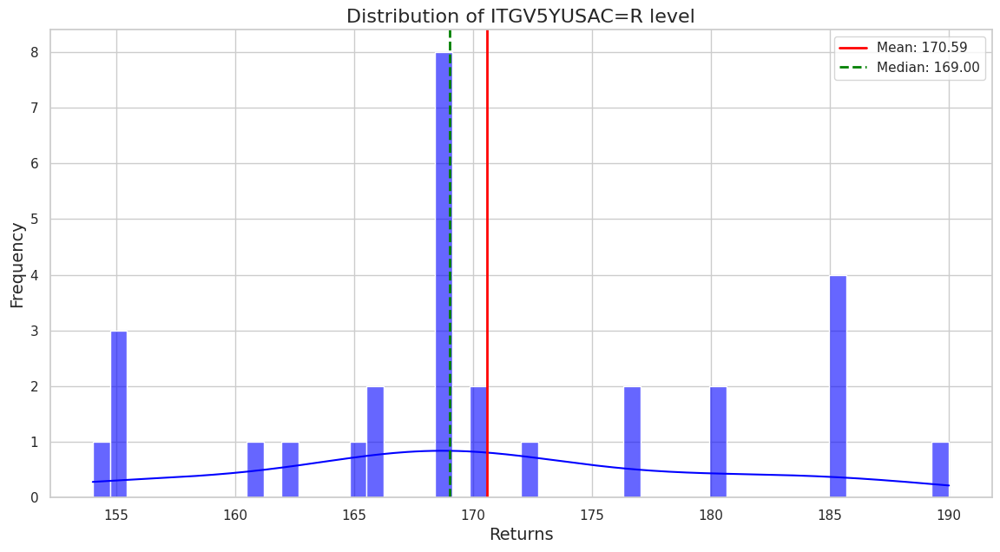

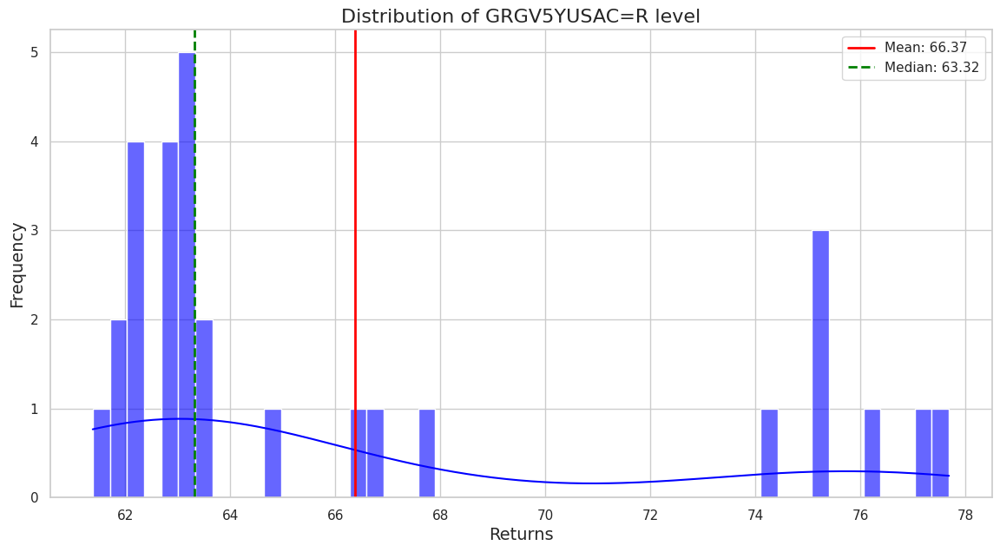

In [116]:
# Plot analysis with historical range for FX data
for column in FX_data.columns:
    plot_distribution_with_enhancements(FX_data, column)

# Plot analysis with historical range for rates data (2Y yields)
for column in Bond2Y_data.columns:
    plot_distribution_with_enhancements(Bond2Y_data, column)

# Plot analysis with historical range for rates data (10y yields)
for column in Bond10Y_data.columns:
    plot_distribution_with_enhancements(Bond10Y_data, column)

# Plot analysis with historical range for money market rates data
for column in MM_data.columns:
    plot_distribution_with_enhancements(MM_data, column)

# Plot analysis with historical range for Rates data
for column in Stock_commo_data.columns:
    plot_distribution_with_enhancements(Stock_commo_data, column)

# Plot analysis with historical range for CDS data
for column in CDS_data.columns:
    plot_distribution_with_enhancements(CDS_data, column)

In [117]:
# Function to calculate rolling correlations
def calculate_rolling_correlation(data, window=30):
    return data.rolling(window=window).corr()

# Function to plot rolling correlations
def plot_rolling_correlations(data, window=30, title="Rolling Correlations"):
    correlations = calculate_rolling_correlation(data, window)

    plt.figure(figsize=(14, 7))
    sns.set(style="whitegrid")

    # Create a color palette
    palette = sns.color_palette("viridis", len(data.columns))

    for i, column in enumerate(data.columns):
        if i == 0:
            continue
        plt.plot(correlations.index, correlations.iloc[:, i-1::len(data.columns)].droplevel(level=1), label=column, color=palette[i])

    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Correlation", fontsize=14)
    plt.title(title, fontsize=16)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

In [102]:
'''
# Plot rolling correlations for FX data
plot_rolling_correlations(FX_data, window=30, title="Rolling Correlations for FX Data")

# Plot rolling correlations for rates data (2Y yields)
plot_rolling_correlations(Bond2Y_data, window=30, title="Rolling Correlations for 2Y Bond Yields")

# Plot rolling correlations for rates data (10Y yields)
plot_rolling_correlations(Bond10Y_data, window=30, title="Rolling Correlations for 10Y Bond Yields")

# Plot rolling correlations for money market rates data
plot_rolling_correlations(MM_data, window=30, title="Rolling Correlations for Money Market Rates")

# Plot rolling correlations for stock and commodity data
plot_rolling_correlations(Stock_commo_data, window=30, title="Rolling Correlations for Stock and Commodity Data")

# Plot rolling correlations for CDS data
plot_rolling_correlations(CDS_data, window=30, title="Rolling Correlations for CDS Data")
'''


'\n# Plot rolling correlations for FX data\nplot_rolling_correlations(FX_data, window=30, title="Rolling Correlations for FX Data")\n\n# Plot rolling correlations for rates data (2Y yields)\nplot_rolling_correlations(Bond2Y_data, window=30, title="Rolling Correlations for 2Y Bond Yields")\n\n# Plot rolling correlations for rates data (10Y yields)\nplot_rolling_correlations(Bond10Y_data, window=30, title="Rolling Correlations for 10Y Bond Yields")\n\n# Plot rolling correlations for money market rates data\nplot_rolling_correlations(MM_data, window=30, title="Rolling Correlations for Money Market Rates")\n\n# Plot rolling correlations for stock and commodity data\nplot_rolling_correlations(Stock_commo_data, window=30, title="Rolling Correlations for Stock and Commodity Data")\n\n# Plot rolling correlations for CDS data\nplot_rolling_correlations(CDS_data, window=30, title="Rolling Correlations for CDS Data")\n'

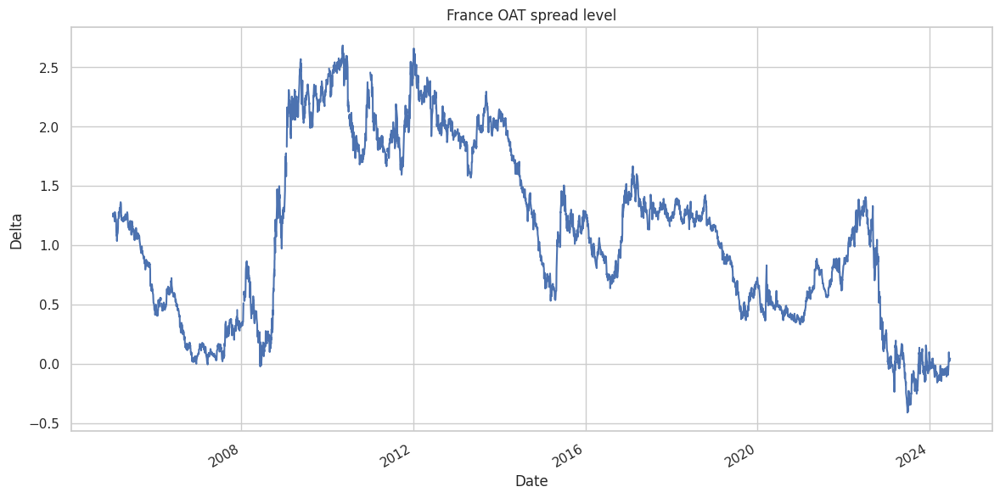

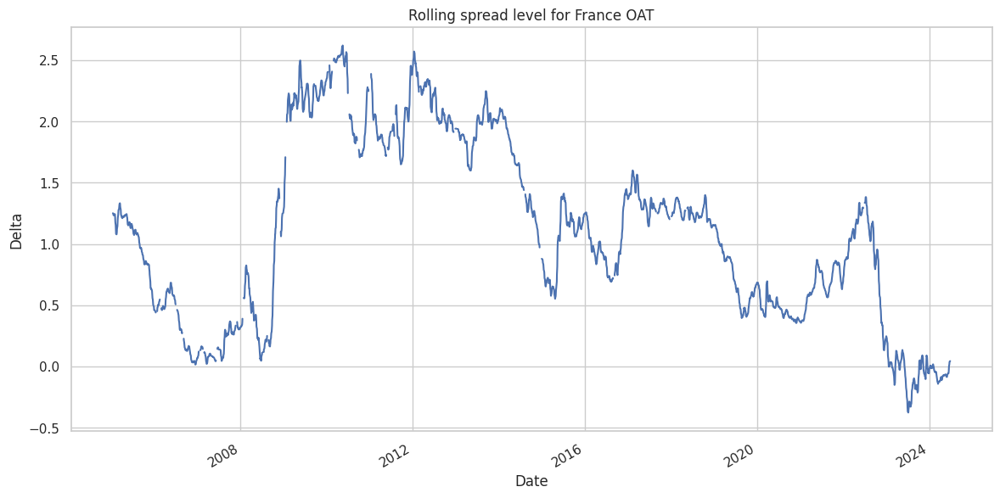

In [118]:
#Spread computation

# Compute spread for each country (10Y - 2Y spread)
spread_FR = Bond10Y_data["FR10YT=RR"] - Bond2Y_data["FR2YT=RR"]

spread_FR.plot(figsize=(14, 7))
plt.title("France OAT spread level")
plt.xlabel("Date")
plt.ylabel("Delta")
plt.show()

# Compute the rolling spread for each country (10Y - 2Y spread)

rolling_spread_FR = spread_FR.rolling(window=7).mean()

rolling_spread_FR.plot(figsize=(14, 7))
plt.title("Rolling spread level for France OAT")
plt.xlabel("Date")
plt.ylabel("Delta")
plt.show()